In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np

In [2]:
train_df = pd.read_csv('train.csv')
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
train_df.shape

(1460, 81)

In [4]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [5]:
train_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [6]:
train_df.isnull().sum().sort_values(ascending=False)

PoolQC           1453
MiscFeature      1406
Alley            1369
Fence            1179
MasVnrType        872
                 ... 
MoSold              0
YrSold              0
SaleType            0
SaleCondition       0
SalePrice           0
Length: 81, dtype: int64

# Missing values 
<p>Put all the columns with missing values in the list</p>
<p>Get average percentage of missing values in each column</p>

In [7]:
features_na = [feature for feature in train_df.columns if train_df[feature].isnull().sum() >= 1]
for feature in features_na:
    print(feature,np.round(train_df[feature].isnull().mean(),4)*100," % missing values")    


LotFrontage 17.740000000000002  % missing values
Alley 93.77  % missing values
MasVnrType 59.730000000000004  % missing values
MasVnrArea 0.5499999999999999  % missing values
BsmtQual 2.53  % missing values
BsmtCond 2.53  % missing values
BsmtExposure 2.6  % missing values
BsmtFinType1 2.53  % missing values
BsmtFinType2 2.6  % missing values
Electrical 0.06999999999999999  % missing values
FireplaceQu 47.260000000000005  % missing values
GarageType 5.55  % missing values
GarageYrBlt 5.55  % missing values
GarageFinish 5.55  % missing values
GarageQual 5.55  % missing values
GarageCond 5.55  % missing values
PoolQC 99.52  % missing values
Fence 80.75  % missing values
MiscFeature 96.3  % missing values


# Since we have a lot of missing values, we should find the relationship between the missing values and the SalePrice

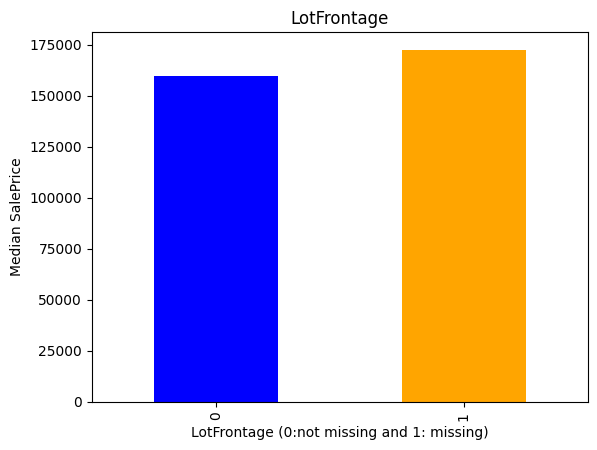

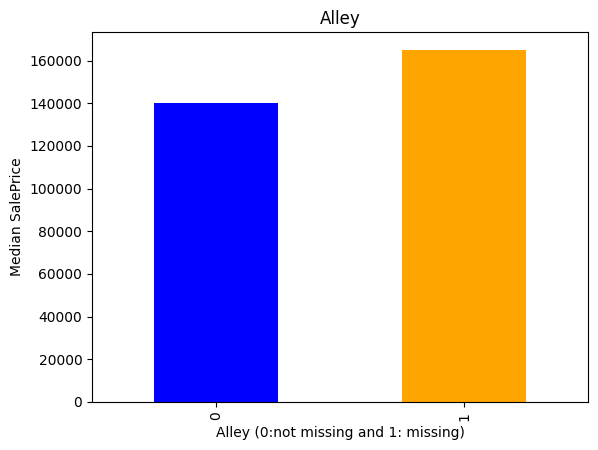

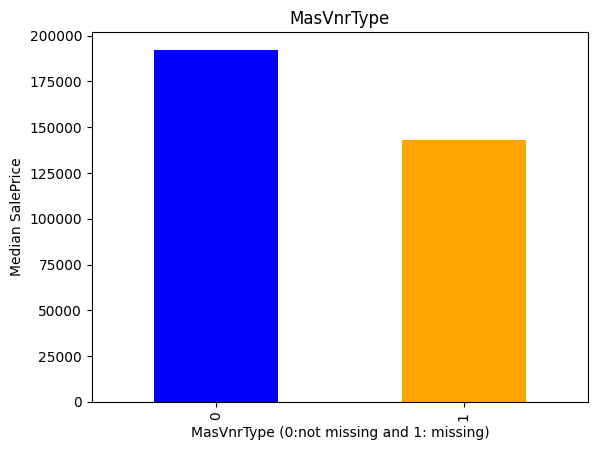

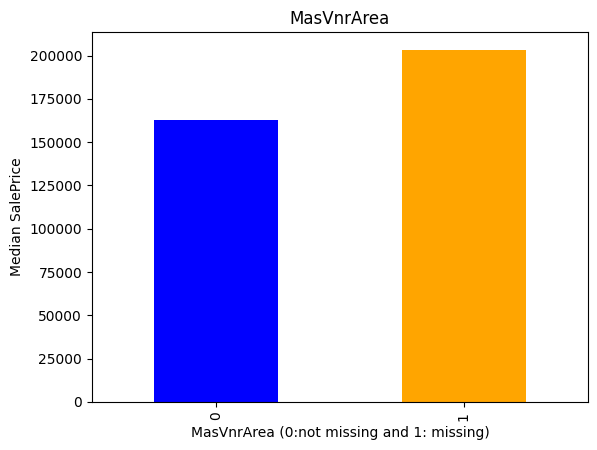

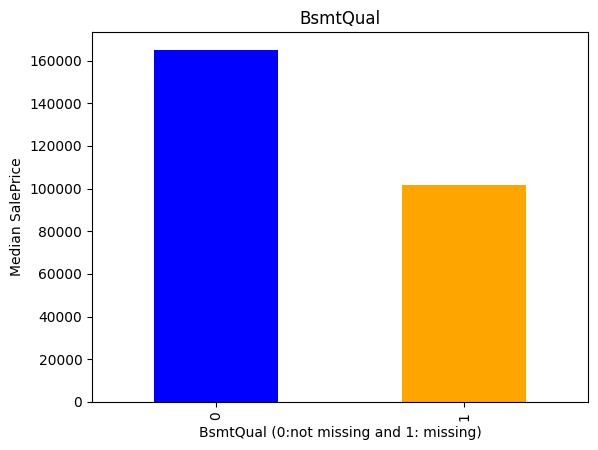

...

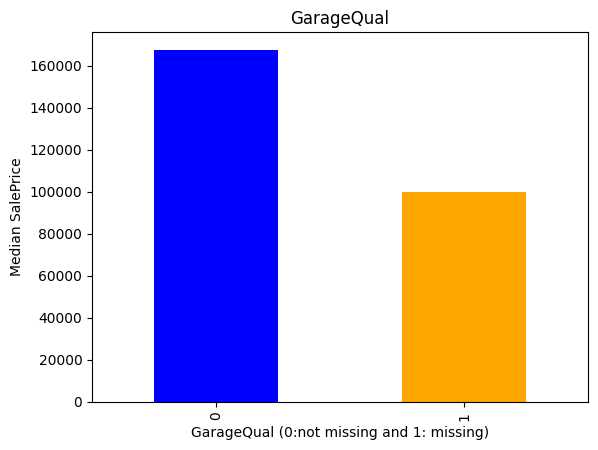

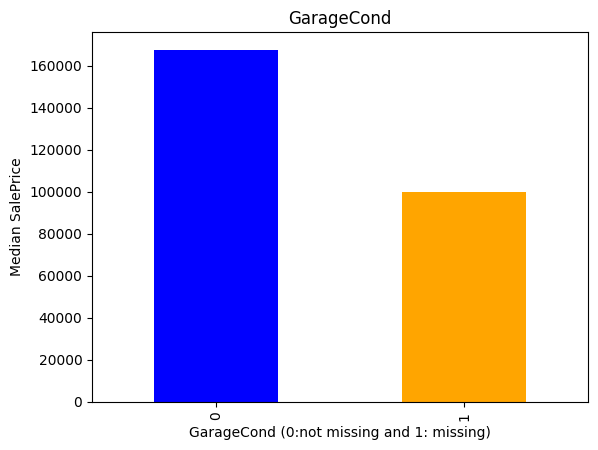

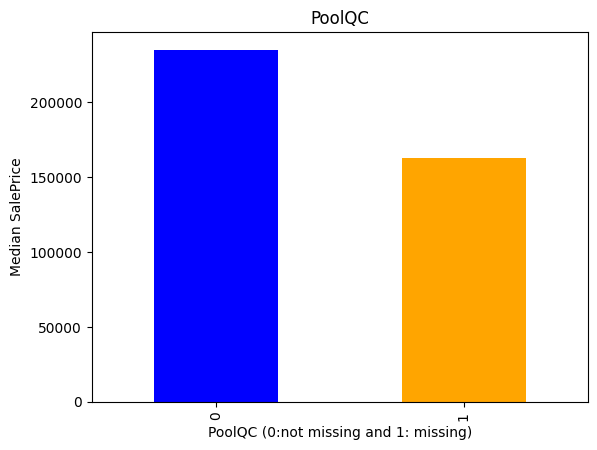

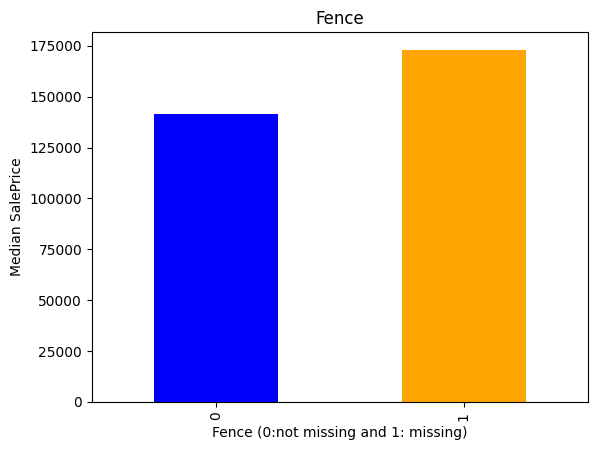

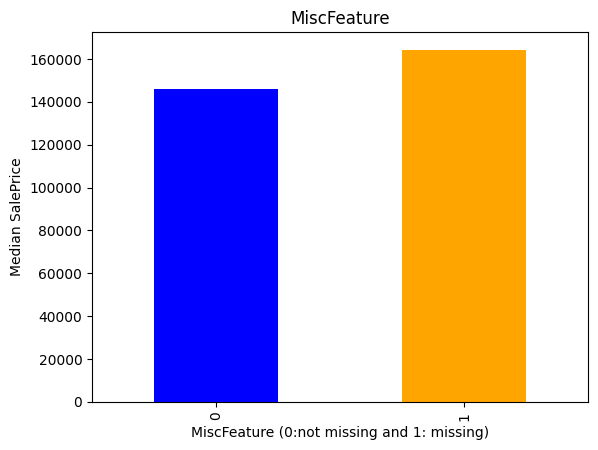

In [8]:
for feature in features_na:
    data = train_df.copy()
    data[feature] = np.where(data[feature].isnull(),1,0)
    data.groupby(feature)['SalePrice'].median().plot.bar(color=['blue','orange'])
    plt.title(feature)
    plt.xlabel(f'{feature} (0:not missing and 1: missing)')
    plt.ylabel('Median SalePrice')
    plt.show()



<p>When there is high number of nan values the saleprice median is high. We have to replace the nan values with something meaningful</p>

In [9]:
#  We don't need the id 
print(len(train_df['Id']))

1460


# numeric variables

In [10]:
num_features = [feature for feature in train_df.columns if train_df[feature].dtype != 'object']
print(num_features)
print(f"Number of numeric features: {len(num_features)}")

['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']
Number of numeric features: 38


In [11]:
train_df[num_features].head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,...,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,...,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,...,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,...,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,...,192,84,0,0,0,0,0,12,2008,250000


# Temporal variables (datetime)

In [12]:
year_feature = [feature for feature in num_features if 'Yr'in feature  or 'Year' in feature]
year_feature 

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

In [13]:
for feature in year_feature:
    print(feature,train_df[feature].unique())

YearBuilt [2003 1976 2001 1915 2000 1993 2004 1973 1931 1939 1965 2005 1962 2006
 1960 1929 1970 1967 1958 1930 2002 1968 2007 1951 1957 1927 1920 1966
 1959 1994 1954 1953 1955 1983 1975 1997 1934 1963 1981 1964 1999 1972
 1921 1945 1982 1998 1956 1948 1910 1995 1991 2009 1950 1961 1977 1985
 1979 1885 1919 1990 1969 1935 1988 1971 1952 1936 1923 1924 1984 1926
 1940 1941 1987 1986 2008 1908 1892 1916 1932 1918 1912 1947 1925 1900
 1980 1989 1992 1949 1880 1928 1978 1922 1996 2010 1946 1913 1937 1942
 1938 1974 1893 1914 1906 1890 1898 1904 1882 1875 1911 1917 1872 1905]
YearRemodAdd [2003 1976 2002 1970 2000 1995 2005 1973 1950 1965 2006 1962 2007 1960
 2001 1967 2004 2008 1997 1959 1990 1955 1983 1980 1966 1963 1987 1964
 1972 1996 1998 1989 1953 1956 1968 1981 1992 2009 1982 1961 1993 1999
 1985 1979 1977 1969 1958 1991 1971 1952 1975 2010 1984 1986 1994 1988
 1954 1957 1951 1978 1974]
GarageYrBlt [2003. 1976. 2001. 1998. 2000. 1993. 2004. 1973. 1931. 1939. 1965. 2005.
 1962. 2006.

Text(0, 0.5, 'SalePrice')

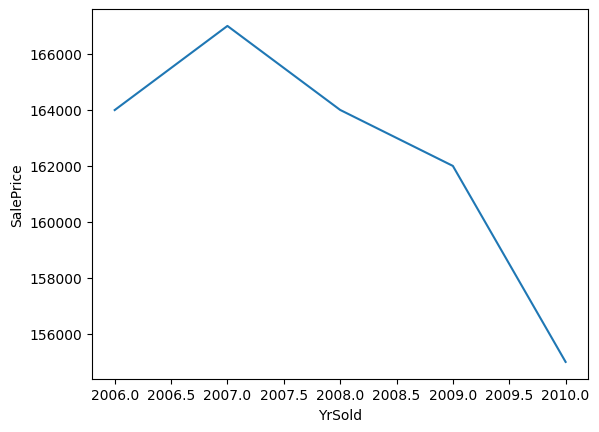

In [14]:
train_df.groupby('YrSold')['SalePrice'].median().plot()
plt.xlabel('YrSold')
plt.ylabel('SalePrice')

# Price decreases as year increases  

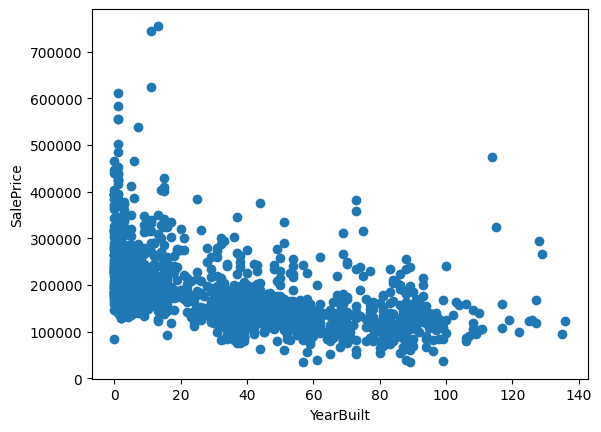

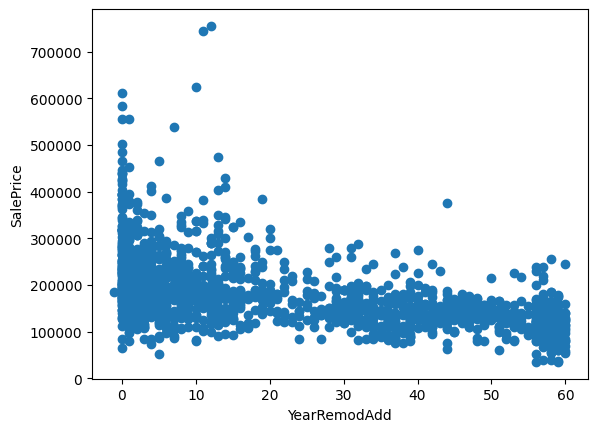

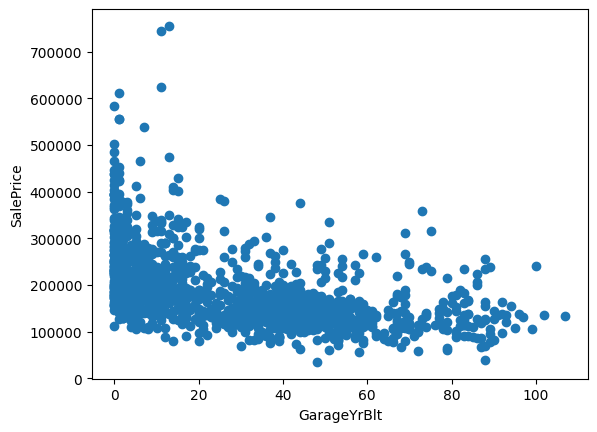

In [15]:
# Compare the difference between all the features and the YrSold
for feature in year_feature:
    data = train_df.copy()
    if feature != 'YrSold':
        data[feature] = data['YrSold'] - data[feature] 

        plt.scatter(data[feature],data['SalePrice'])
        plt.xlabel(feature)
        plt.ylabel('SalePrice')
        plt.show()

<p>We can see a negative correlation between all year features and SalePrice</p>
<p>Early the house is built higher the sale price</p>

In [16]:
# discrete features 
discrete_features = [feature for feature in num_features if len(train_df[feature].unique()) < 25 and feature not in year_feature+['Id']]
print(f"Number of discrete features: {len(discrete_features)}")

Number of discrete features: 17


In [17]:
discrete_features

['MSSubClass',
 'OverallQual',
 'OverallCond',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 '3SsnPorch',
 'PoolArea',
 'MiscVal',
 'MoSold']

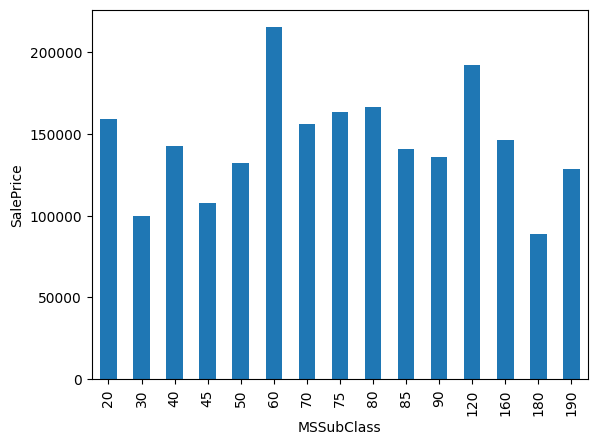

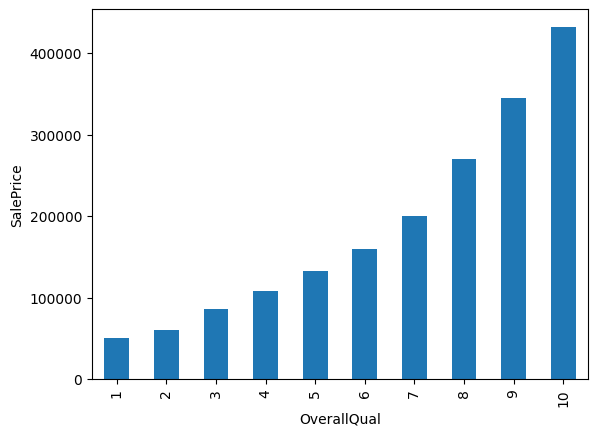

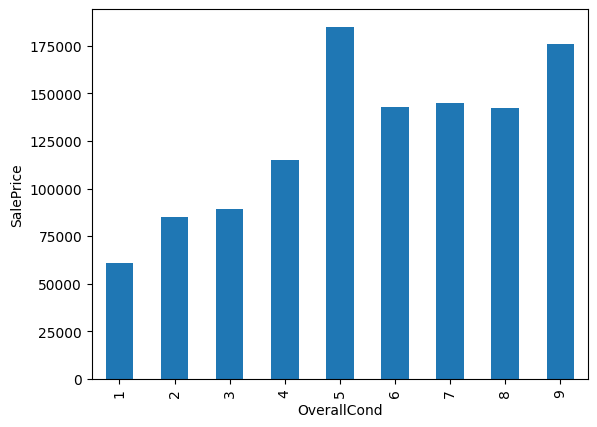

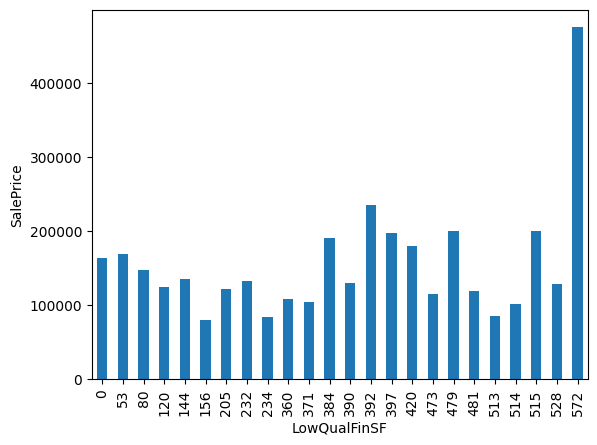

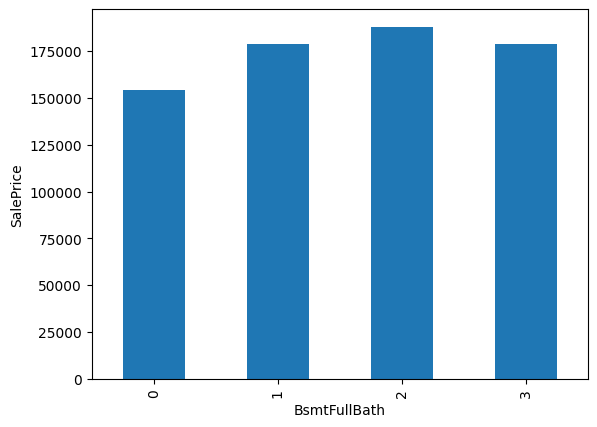

...

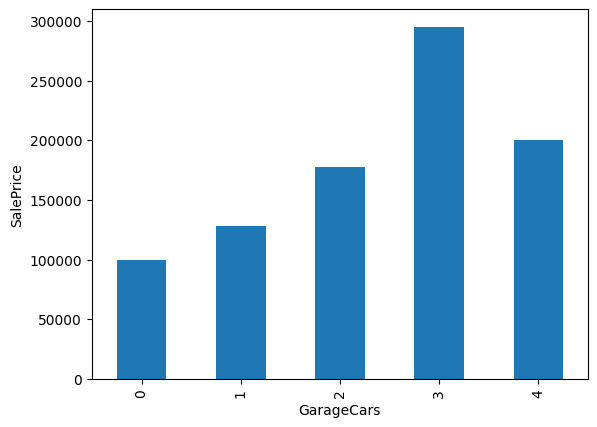

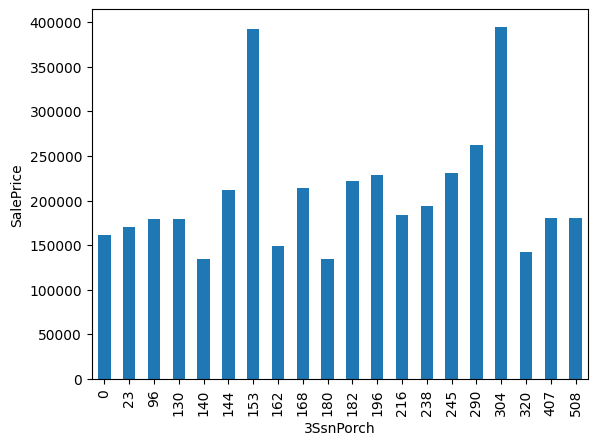

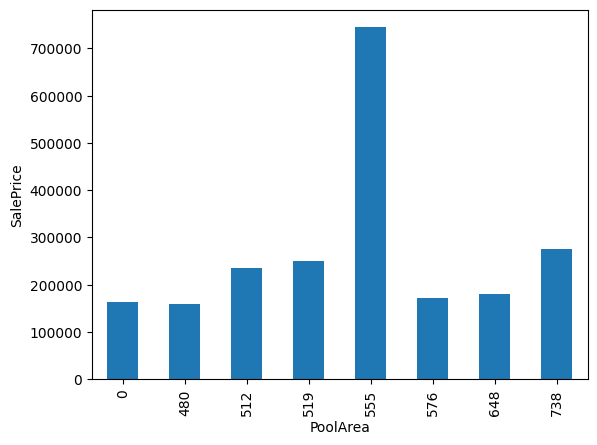

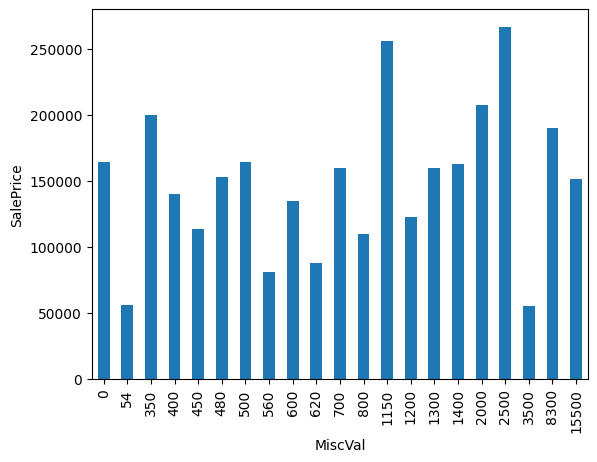

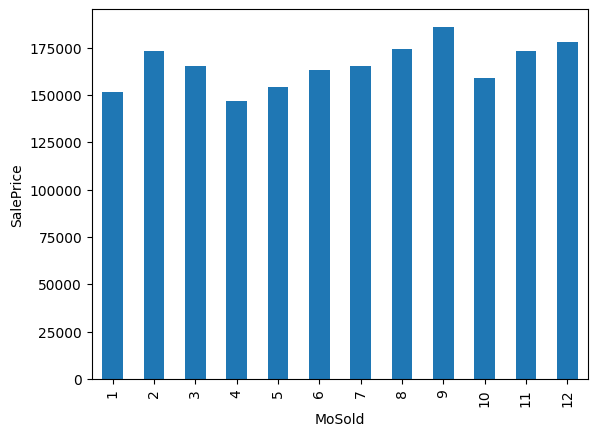

In [18]:
# Relationshup between discrete features and salePrice
for feature in discrete_features:
    data = train_df.copy()
    data.groupby(feature)['SalePrice'].median().plot.bar(y='SalePrice')
    plt.xlabel(feature)
    plt.ylabel('SalePrice')
    plt.show()

In [19]:
continuous_features =[feature for feature in num_features if feature not in discrete_features +year_feature+['Id']]
print(f"Number of the continous features: {len(continuous_features)}")

Number of the continous features: 16


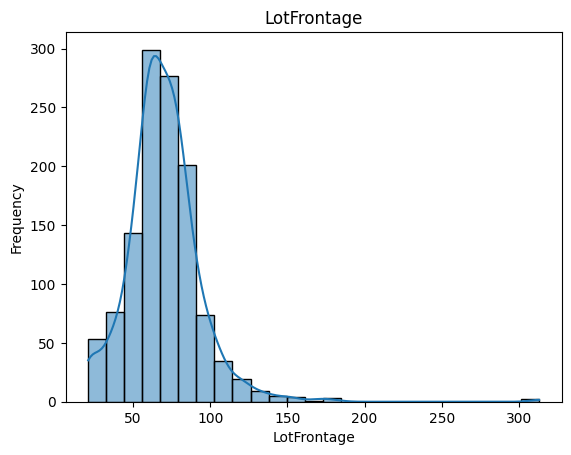

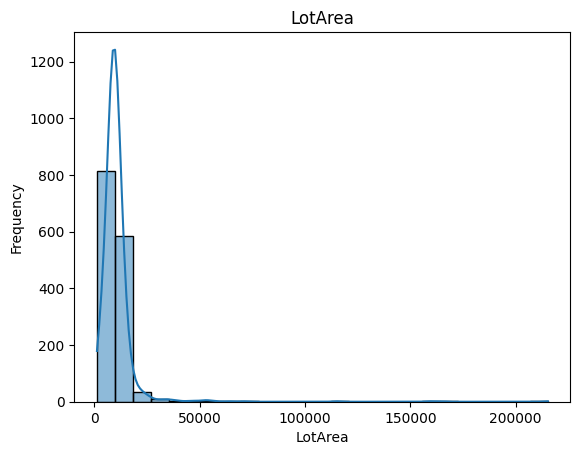

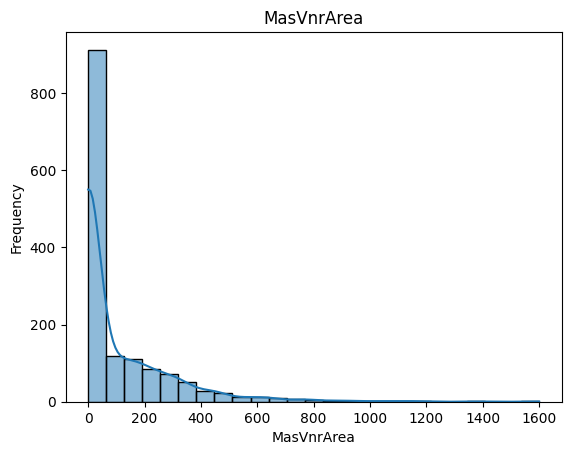

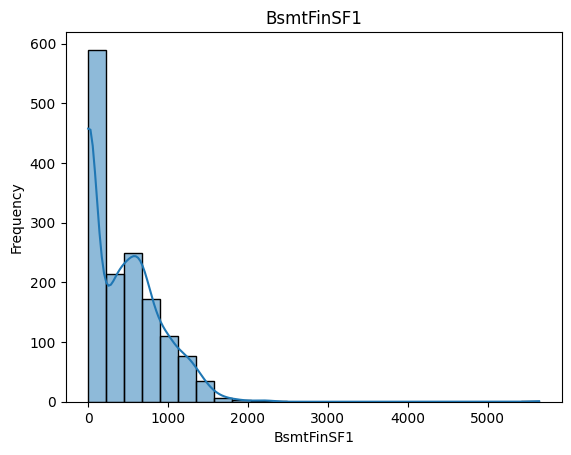

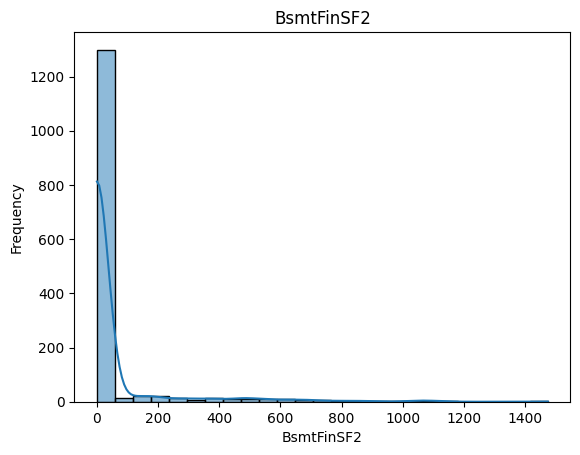

...

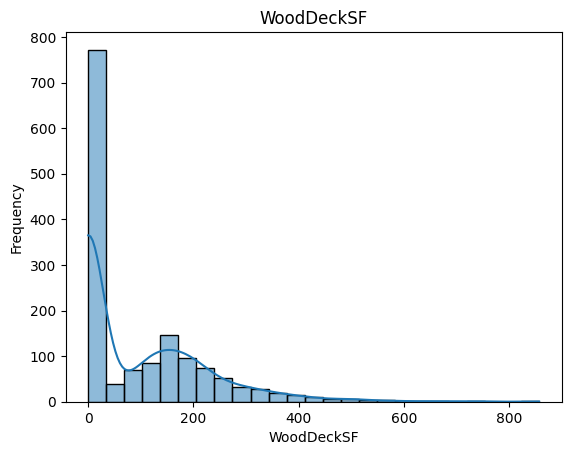

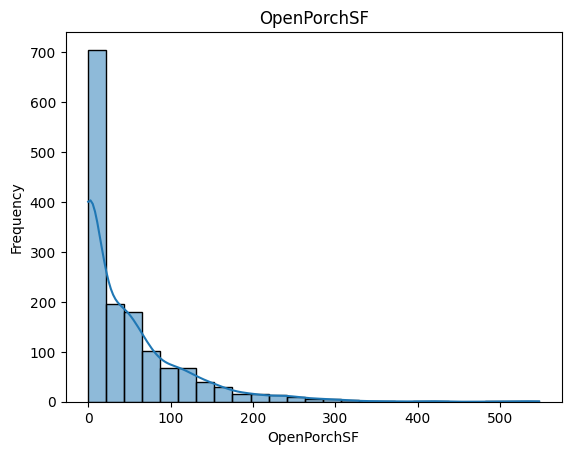

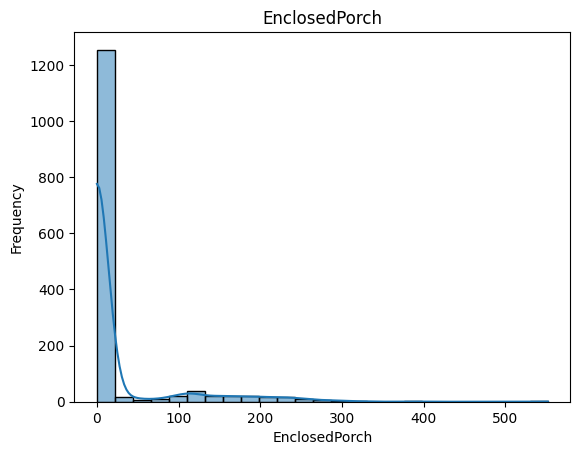

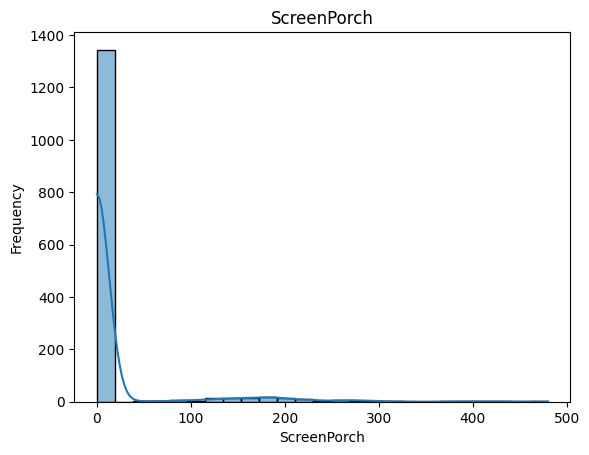

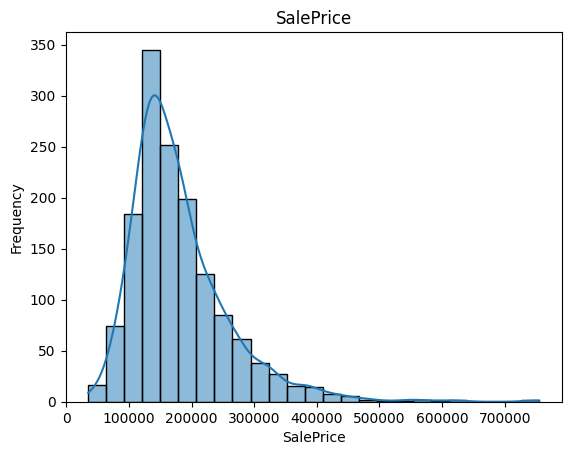

In [20]:
for feature in continuous_features:
    data = train_df.copy()
    sns.histplot(data[feature],bins=25,kde=True)
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.title(feature)
    plt.show()

Continuous features are highly skewed we need to transform these in order to normalise it

# Normalising the continuous data using log transform

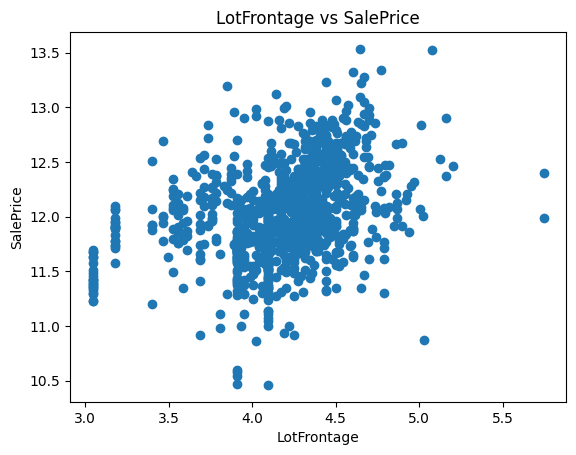

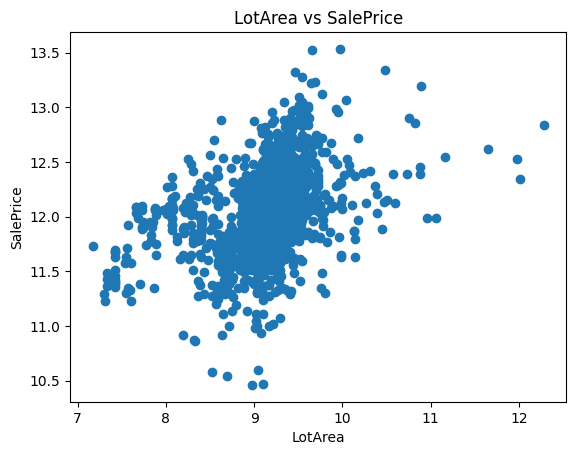

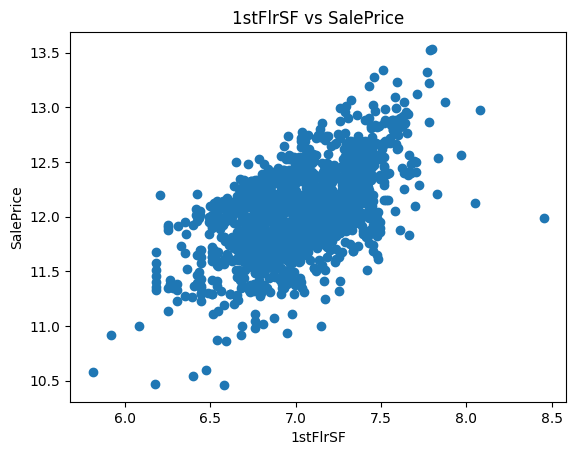

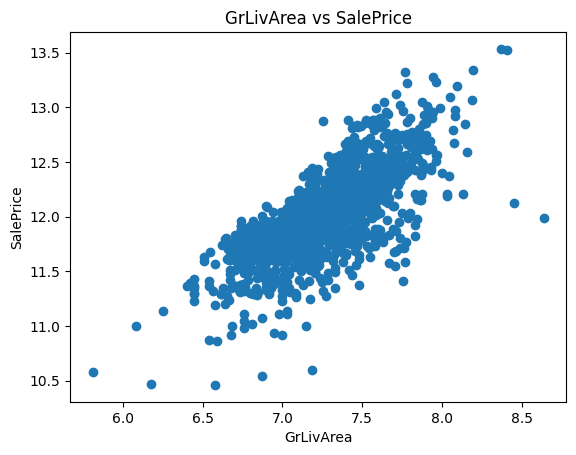

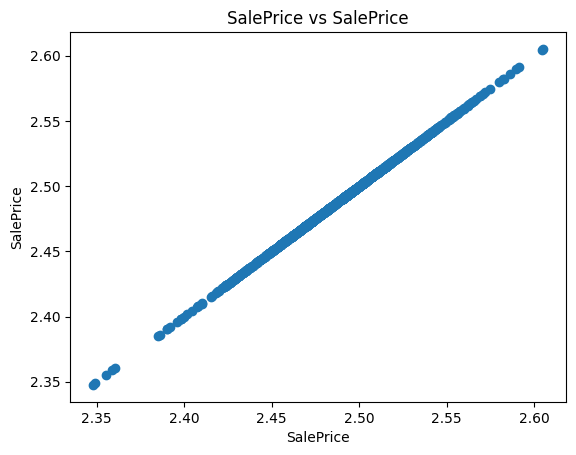

In [21]:
for feature in continuous_features:
    data = train_df.copy()
    if 0 in data[feature].unique(): # we will get an invalid output because log(0) is invalid 
        pass 
    else:
        data[feature] = np.log(data[feature])
        data['SalePrice'] = np.log(data['SalePrice']) # distrubution of salePrice is skewed
        plt.scatter(data[feature],data['SalePrice'])
        plt.title(f"{feature} vs SalePrice")
        plt.xlabel(feature)
        plt.ylabel('SalePrice')
        plt.show() 


# Outliers

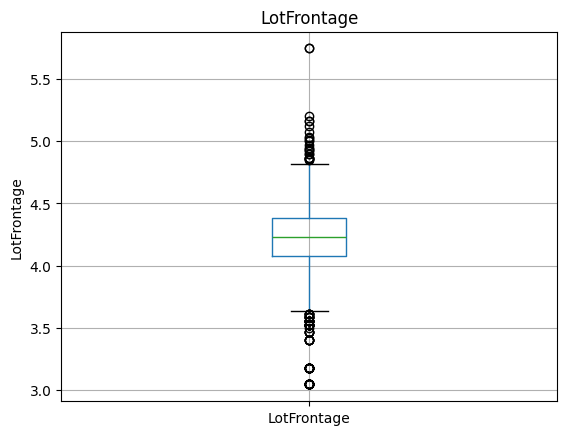

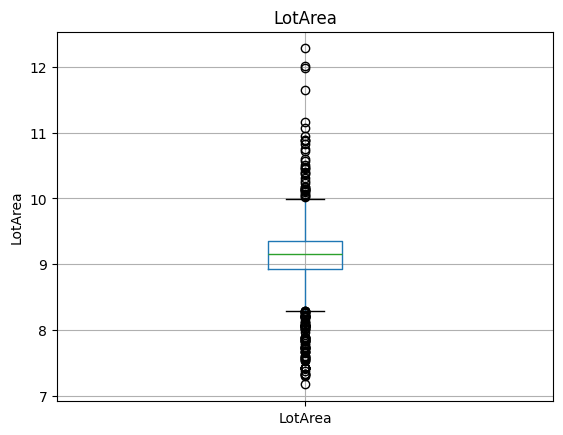

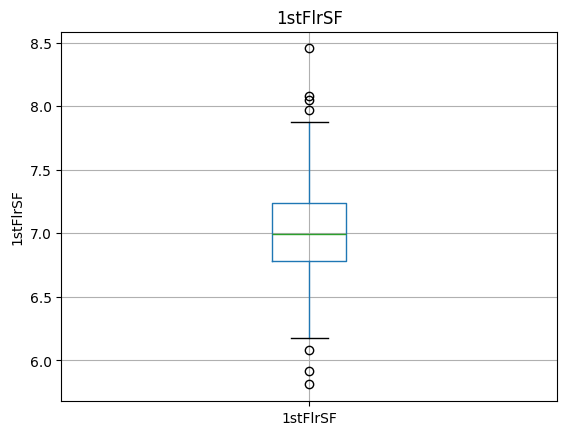

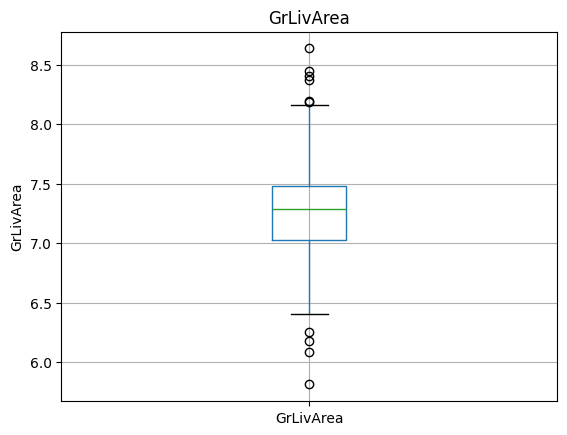

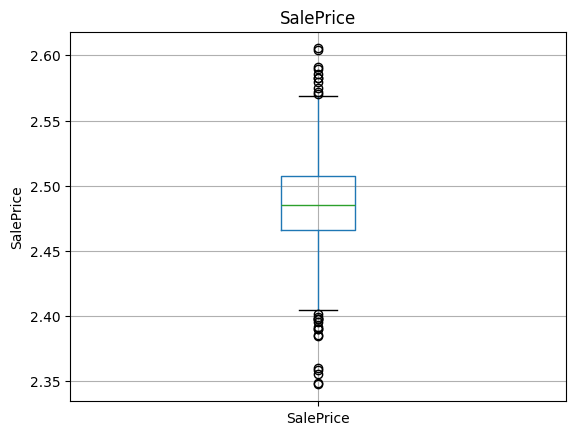

In [22]:
for feature in continuous_features:
    data = train_df.copy()
    if 0 in data[feature].unique(): # we will get an invalid output because log(0) is invalid 
        pass 
    else:
        data[feature] = np.log(data[feature])
        data['SalePrice'] = np.log(data['SalePrice']) # distrubution of salePrice is skewed
        data.boxplot(column=feature)
        # plt.xlabel(feature)
        plt.ylabel(feature)
        plt.title(feature)
        plt.show()

# Categorical Variables

In [23]:
cat_features = [feature for feature in train_df.columns if train_df[feature].dtypes == 'object']
print(f"Number of categorical features: {len(cat_features)}")

Number of categorical features: 43


In [24]:
train_df[cat_features].head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,...,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal


In [25]:
for feature in cat_features:
    data = train_df.copy()
    print("The feature is {} and number of categories are {}".format(feature,len(data[feature].unique())))
    

The feature is MSZoning and number of categories are 5
The feature is Street and number of categories are 2
The feature is Alley and number of categories are 3
The feature is LotShape and number of categories are 4
The feature is LandContour and number of categories are 4
The feature is Utilities and number of categories are 2
The feature is LotConfig and number of categories are 5
The feature is LandSlope and number of categories are 3
The feature is Neighborhood and number of categories are 25
The feature is Condition1 and number of categories are 9
The feature is Condition2 and number of categories are 8
The feature is BldgType and number of categories are 5
The feature is HouseStyle and number of categories are 8
The feature is RoofStyle and number of categories are 6
The feature is RoofMatl and number of categories are 8
The feature is Exterior1st and number of categories are 15
The feature is Exterior2nd and number of categories are 16
The feature is MasVnrType and number of cate

Find the relationship between categorical features and SalePrice

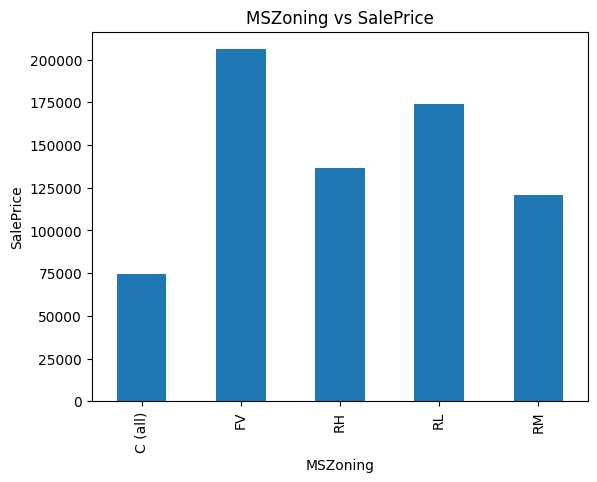

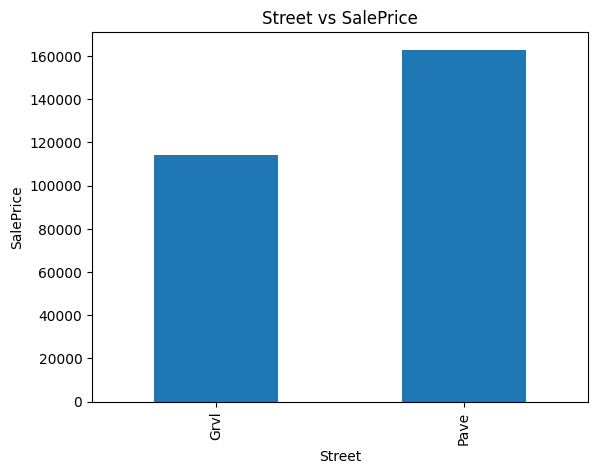

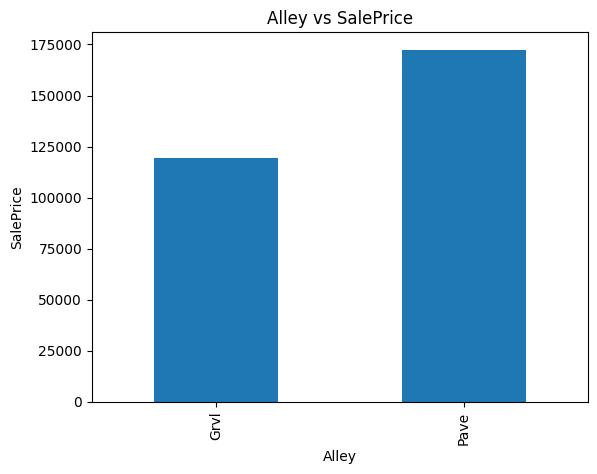

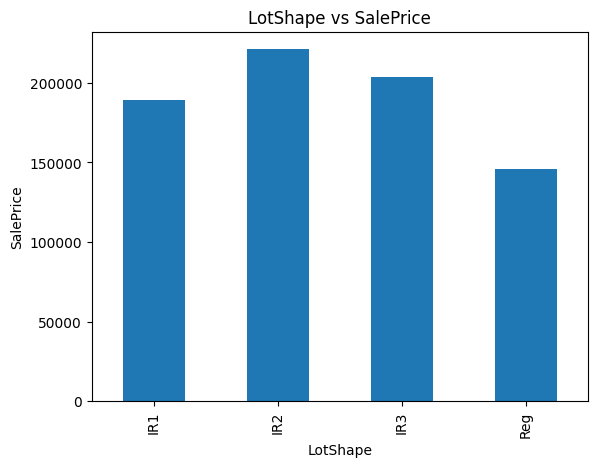

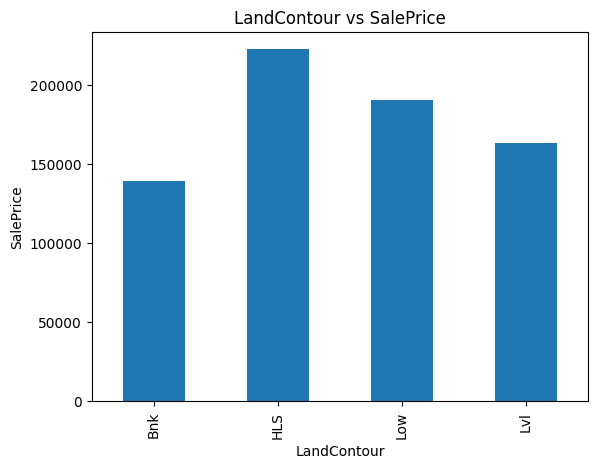

...

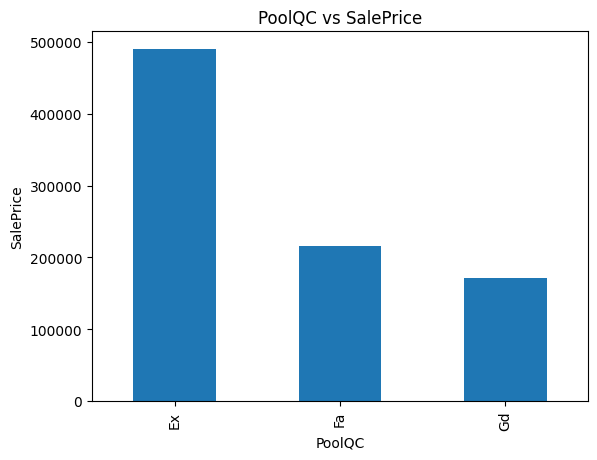

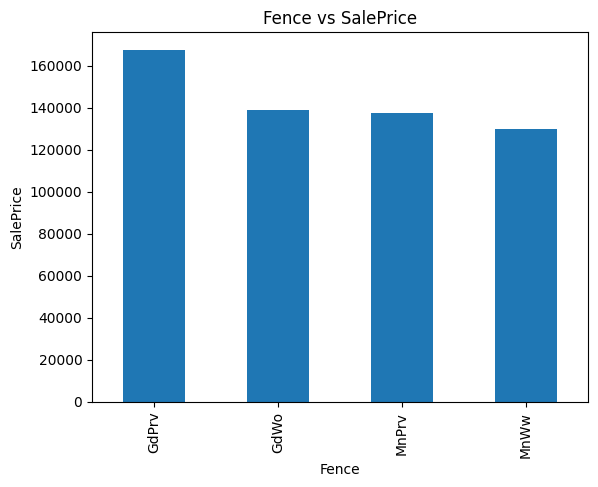

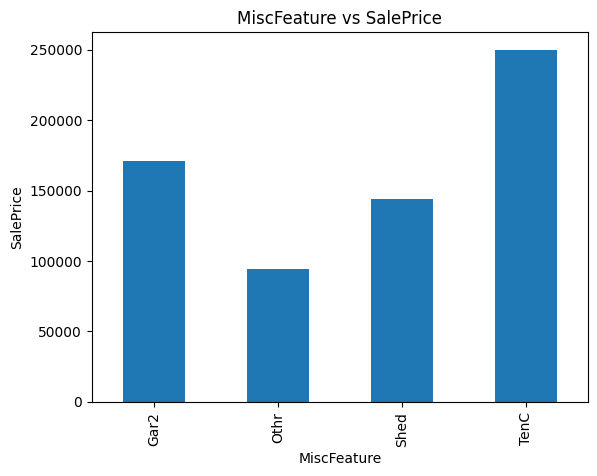

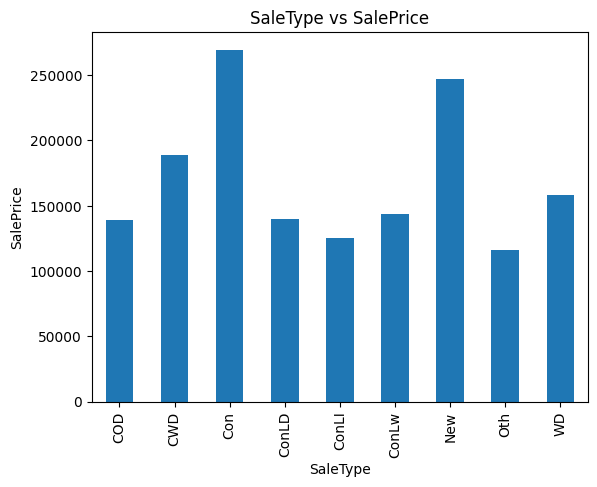

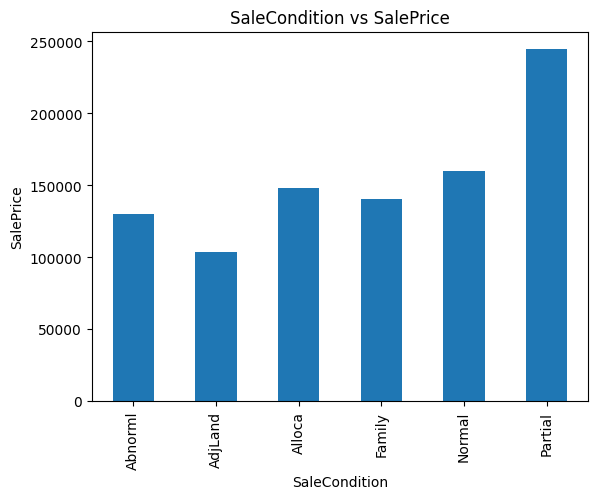

In [26]:
for feature in cat_features:
    data = train_df.copy()
    data.groupby(feature)['SalePrice'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('SalePrice')
    plt.title(f'{feature} vs SalePrice')
    plt.show()

# Feature engineering 

<li>Handling missing values</li>
<li>Temporal Variables</li>
<li>Categorical Variables remove rare labels</li>
<li>Standardise the values to have the same range</li>

In [27]:
# Always to do train test split before feature engineering 
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(train_df,
                                                train_df['SalePrice'],
                                                test_size=0.1,
                                                random_state=0)


In [28]:
X_train.shape,X_test.shape

((1314, 81), (146, 81))

Handling all the missing nan values for categorical features

In [29]:
cat_features_nan = [feature for feature in cat_features if train_df[feature].isnull().sum() >= 1 and train_df[feature].dtype == 'object']
cat_features_nan

['Alley',
 'MasVnrType',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Electrical',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PoolQC',
 'Fence',
 'MiscFeature']

In [30]:
for feature in cat_features_nan:
    print("{} : {}% missing values".format(feature,np.round(train_df[feature].isnull().mean() * 100,4)))


Alley : 93.7671% missing values
MasVnrType : 59.726% missing values
BsmtQual : 2.5342% missing values
BsmtCond : 2.5342% missing values
BsmtExposure : 2.6027% missing values
BsmtFinType1 : 2.5342% missing values
BsmtFinType2 : 2.6027% missing values
Electrical : 0.0685% missing values
FireplaceQu : 47.2603% missing values
GarageType : 5.5479% missing values
GarageFinish : 5.5479% missing values
GarageQual : 5.5479% missing values
GarageCond : 5.5479% missing values
PoolQC : 99.5205% missing values
Fence : 80.7534% missing values
MiscFeature : 96.3014% missing values


In [31]:
# Replace missing value with a new label Missing
def replace_cat_features(data,cat_features_nan):
    data = data.copy()
    data[cat_features_nan] = data[cat_features_nan].fillna('Missing')
    return data

train_df = replace_cat_features(train_df,cat_features_nan)
train_df[cat_features_nan].isnull().sum()

Alley           0
MasVnrType      0
BsmtQual        0
BsmtCond        0
BsmtExposure    0
BsmtFinType1    0
BsmtFinType2    0
Electrical      0
FireplaceQu     0
GarageType      0
GarageFinish    0
GarageQual      0
GarageCond      0
PoolQC          0
Fence           0
MiscFeature     0
dtype: int64

For any missing values in categorical features create a new label

In [32]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Missing,Reg,Lvl,AllPub,...,0,Missing,Missing,Missing,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Missing,Reg,Lvl,AllPub,...,0,Missing,Missing,Missing,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,Missing,IR1,Lvl,AllPub,...,0,Missing,Missing,Missing,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,Missing,IR1,Lvl,AllPub,...,0,Missing,Missing,Missing,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,Missing,IR1,Lvl,AllPub,...,0,Missing,Missing,Missing,0,12,2008,WD,Normal,250000


In [33]:
# Examine the missing values in num_features
num_features_nan = [feature for feature in num_features if train_df[feature].isnull().sum() >= 1 and train_df[feature].dtypes != 'object']
print(num_features_nan)

for feature in num_features_nan:
    print("{}:{}% missing values".format(feature,np.round(train_df[feature].isnull().mean(),4)))

['LotFrontage', 'MasVnrArea', 'GarageYrBlt']
LotFrontage:0.1774% missing values
MasVnrArea:0.0055% missing values
GarageYrBlt:0.0555% missing values


In [34]:
# Replace num_features with median values 

for feature in num_features_nan:
    median = train_df[feature].median()
    # create new feature that captures the nan values 
    train_df[feature + 'nan'] = np.where(train_df[feature].isnull(),1,0) 
    train_df[feature] = train_df[feature].fillna(median) 

train_df[num_features_nan].isnull().sum()

LotFrontage    0
MasVnrArea     0
GarageYrBlt    0
dtype: int64

<b>Good practice</b> when we have nan values in numerical features create a new column that specifies indicating 1,0 for missing values in that column

In [35]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,LotFrontagenan,MasVnrAreanan,GarageYrBltnan
0,1,60,RL,65.0,8450,Pave,Missing,Reg,Lvl,AllPub,...,Missing,0,2,2008,WD,Normal,208500,0,0,0
1,2,20,RL,80.0,9600,Pave,Missing,Reg,Lvl,AllPub,...,Missing,0,5,2007,WD,Normal,181500,0,0,0
2,3,60,RL,68.0,11250,Pave,Missing,IR1,Lvl,AllPub,...,Missing,0,9,2008,WD,Normal,223500,0,0,0
3,4,70,RL,60.0,9550,Pave,Missing,IR1,Lvl,AllPub,...,Missing,0,2,2006,WD,Abnorml,140000,0,0,0
4,5,60,RL,84.0,14260,Pave,Missing,IR1,Lvl,AllPub,...,Missing,0,12,2008,WD,Normal,250000,0,0,0


In [36]:
# Numerical Variables 
features = ['LotFrontage','LotArea','1stFlrSF','GrLivArea','SalePrice']
for feature in features:
    print("Skewness before log transform")
    print(f"{feature}:{train_df[feature].skew()}")
    train_df[feature] = np.log(train_df[feature])
    print("Skewness after log transform")
    print(f"{feature}:{train_df[feature].skew()}")

Skewness before log transform
LotFrontage:2.4091466665496006
Skewness after log transform
LotFrontage:-0.9091148013817885
Skewness before log transform
LotArea:12.207687851233496
Skewness after log transform
LotArea:-0.1379938086958118
Skewness before log transform
1stFlrSF:1.3767566220336365
Skewness after log transform
1stFlrSF:0.07915695223960692
Skewness before log transform
GrLivArea:1.3665603560164552
Skewness after log transform
GrLivArea:-0.006995182187690808
Skewness before log transform
SalePrice:1.8828757597682129
Skewness after log transform
SalePrice:0.12133506220520406


# Handling rare categorical features 
We will remove the categorical feature that are present 1%  less than the observations 

In [37]:
for feature in cat_features:
    # Get the percentage of each feature in the dataset 
    temp = train_df.groupby(feature)['SalePrice'].count() / len(train_df)
    temp_df = temp[temp > 0.01].index
    train_df[feature] =np.where(train_df[feature].isin(temp_df),train_df[feature],'Rare var')



In [38]:
train_df.head(100)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,LotFrontagenan,MasVnrAreanan,GarageYrBltnan
0,1,60,RL,4.174387,9.041922,Pave,Missing,Reg,Lvl,AllPub,...,Missing,0,2,2008,WD,Normal,12.247694,0,0,0
1,2,20,RL,4.382027,9.169518,Pave,Missing,Reg,Lvl,AllPub,...,Missing,0,5,2007,WD,Normal,12.109011,0,0,0
2,3,60,RL,4.219508,9.328123,Pave,Missing,IR1,Lvl,AllPub,...,Missing,0,9,2008,WD,Normal,12.317167,0,0,0
3,4,70,RL,4.094345,9.164296,Pave,Missing,IR1,Lvl,AllPub,...,Missing,0,2,2006,WD,Abnorml,11.849398,0,0,0
4,5,60,RL,4.430817,9.565214,Pave,Missing,IR1,Lvl,AllPub,...,Missing,0,12,2008,WD,Normal,12.429216,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,60,RL,4.234107,9.186560,Pave,Missing,IR2,Lvl,AllPub,...,Shed,480,4,2009,WD,Normal,12.128111,1,0,0
96,97,20,RL,4.356709,9.236398,Pave,Missing,IR1,Lvl,AllPub,...,Missing,0,8,2006,WD,Normal,12.273731,0,0,0
97,98,20,RL,4.290459,9.298443,Pave,Missing,Reg,HLS,AllPub,...,Missing,0,5,2007,WD,Normal,11.458997,0,0,0
98,99,30,RL,4.442651,9.270965,Pave,Missing,Reg,Lvl,AllPub,...,Shed,400,5,2010,COD,Abnorml,11.326596,0,0,0


# Feature Encoding 

In [39]:
for feature in cat_features:
    labels_ordered = train_df.groupby(feature)['SalePrice'].mean().sort_values().index
    labels_ordered = {k : i for i,k in enumerate(labels_ordered,0)}
    train_df[feature] = train_df[feature].map(labels_ordered)

In [40]:
train_df.head(10)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,LotFrontagenan,MasVnrAreanan,GarageYrBltnan
0,1,60,3,4.174387,9.041922,1,2,0,1,1,...,2,0,2,2008,2,3,12.247694,0,0,0
1,2,20,3,4.382027,9.169518,1,2,0,1,1,...,2,0,5,2007,2,3,12.109011,0,0,0
2,3,60,3,4.219508,9.328123,1,2,1,1,1,...,2,0,9,2008,2,3,12.317167,0,0,0
3,4,70,3,4.094345,9.164296,1,2,1,1,1,...,2,0,2,2006,2,0,11.849398,0,0,0
4,5,60,3,4.430817,9.565214,1,2,1,1,1,...,2,0,12,2008,2,3,12.429216,0,0,0
5,6,50,3,4.442651,9.554993,1,2,1,1,1,...,1,700,10,2009,2,3,11.870600,0,0,0
6,7,20,3,4.317488,9.218705,1,2,0,1,1,...,2,0,8,2007,2,3,12.634603,0,0,0
7,8,60,3,4.234107,9.247829,1,2,1,1,1,...,1,350,11,2009,2,3,12.206073,1,0,0
8,9,50,1,3.931826,8.719317,1,2,0,1,1,...,2,0,4,2008,2,0,11.774520,0,0,0
9,10,190,3,3.912023,8.911934,1,2,0,1,1,...,2,0,1,2008,2,3,11.678440,0,0,0


In [41]:
sns.pairplot(train_df[num_features])

<Axes: >

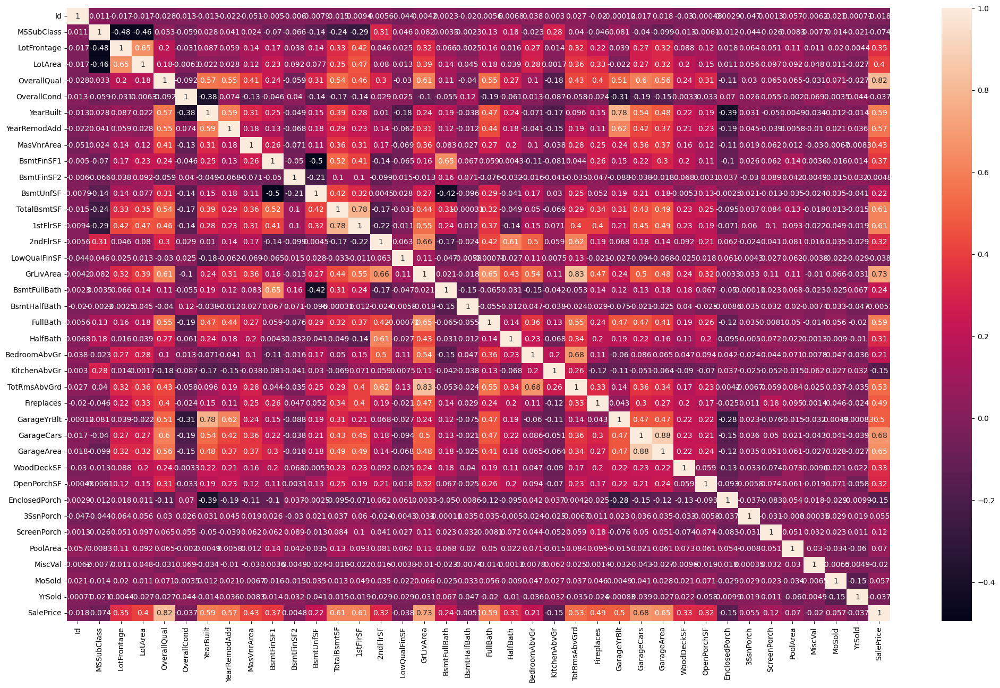

In [42]:
plt.figure(figsize=(25,15))
sns.heatmap(train_df[num_features].corr(),annot=True)

# Feature Scaling

In [43]:
scaling_feature = [feature for feature in train_df.columns if feature not in ['Id','SalePrice']]
len(scaling_feature)

82

In [44]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(train_df[scaling_feature])

MinMaxScaler()

In [45]:
scaler.transform(train_df[scaling_feature])

array([[0.23529412, 0.75      , 0.41820812, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.75      , 0.49506375, ..., 0.        , 0.        ,
        0.        ],
       [0.23529412, 0.75      , 0.434909  , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.29411765, 0.75      , 0.42385922, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.75      , 0.434909  , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.75      , 0.47117546, ..., 0.        , 0.        ,
        0.        ]])

In [46]:
data = pd.concat([train_df[['Id', 'SalePrice']].reset_index(drop=True),
                    pd.DataFrame(scaler.transform(train_df[scaling_feature]), columns=scaling_feature)],
                    axis=1)


In [47]:
data.head()

,Id,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,...,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,LotFrontagenan,MasVnrAreanan,GarageYrBltnan
0,1,12.247694,0.235294,0.75,0.418208,0.366344,1.0,1.0,0.000000,0.333333,...,1.0,1.0,0.0,0.090909,0.50,0.666667,0.75,0.0,0.0,0.0
1,2,12.109011,0.000000,0.75,0.495064,0.391317,1.0,1.0,0.000000,0.333333,...,1.0,1.0,0.0,0.363636,0.25,0.666667,0.75,0.0,0.0,0.0
2,3,12.317167,0.235294,0.75,0.434909,0.422359,1.0,1.0,0.333333,0.333333,...,1.0,1.0,0.0,0.727273,0.50,0.666667,0.75,0.0,0.0,0.0
3,4,11.849398,0.294118,0.75,0.388581,0.390295,1.0,1.0,0.333333,0.333333,...,1.0,1.0,0.0,0.090909,0.00,0.666667,0.00,0.0,0.0,0.0
4,5,12.429216,0.235294,0.75,0.513123,0.468761,1.0,1.0,0.333333,0.333333,...,1.0,1.0,0.0,1.000000,0.50,0.666667,0.75,0.0,0.0,0.0


In [48]:
data.to_csv('X_train.csv',index=False)

# Feature selection 

In [49]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

In [50]:
data = pd.read_csv('X_train.csv')

In [51]:
data.head()

,Id,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,...,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,LotFrontagenan,MasVnrAreanan,GarageYrBltnan
0,1,12.247694,0.235294,0.75,0.418208,0.366344,1.0,1.0,0.000000,0.333333,...,1.0,1.0,0.0,0.090909,0.50,0.666667,0.75,0.0,0.0,0.0
1,2,12.109011,0.000000,0.75,0.495064,0.391317,1.0,1.0,0.000000,0.333333,...,1.0,1.0,0.0,0.363636,0.25,0.666667,0.75,0.0,0.0,0.0
2,3,12.317167,0.235294,0.75,0.434909,0.422359,1.0,1.0,0.333333,0.333333,...,1.0,1.0,0.0,0.727273,0.50,0.666667,0.75,0.0,0.0,0.0
3,4,11.849398,0.294118,0.75,0.388581,0.390295,1.0,1.0,0.333333,0.333333,...,1.0,1.0,0.0,0.090909,0.00,0.666667,0.00,0.0,0.0,0.0
4,5,12.429216,0.235294,0.75,0.513123,0.468761,1.0,1.0,0.333333,0.333333,...,1.0,1.0,0.0,1.000000,0.50,0.666667,0.75,0.0,0.0,0.0


In [54]:
X_train = data.drop(['Id','SalePrice'],axis=1)
y_train = data[['SalePrice']]

In [59]:
feature_selection_model = SelectFromModel(Lasso(alpha=0.005,random_state=0))
feature_selection_model.fit(X_train,y_train)

SelectFromModel(estimator=Lasso(alpha=0.005, random_state=0))

In [61]:
feature_selection_model.get_support()

array([ True,  True, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False,  True, False,
       False,  True,  True, False, False, False, False, False, False,
       False, False,  True, False,  True, False, False, False, False,
       False, False, False,  True,  True, False,  True, False, False,
        True,  True, False, False, False, False, False,  True, False,
       False,  True,  True,  True, False,  True,  True, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False])

In [62]:
selected_features = X_train.columns[feature_selection_model.get_support()]
print("Total features: {}".format(X_train.shape[1]))
print("Selected features: {}".format(len(selected_features)))
print('features with coefficients shrank to zero: {}'.format(
    np.sum(feature_selection_model.estimator_.coef_ == 0)))


Total features: 82
Selected features: 21
features with coefficients shrank to zero: 61


In [63]:
selected_features

Index(['MSSubClass', 'MSZoning', 'Neighborhood', 'OverallQual', 'YearRemodAdd',
       'RoofStyle', 'BsmtQual', 'BsmtExposure', 'HeatingQC', 'CentralAir',
       '1stFlrSF', 'GrLivArea', 'BsmtFullBath', 'KitchenQual', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageCars', 'PavedDrive',
       'SaleCondition'],
      dtype='object')

In [64]:
X_train = X_train[selected_features]